# **Importing library&function**






In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.preprocessing import OneHotEncoder
import numpy as np
import pandas as pd
import shutil
import time
import cv2 as cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, mean_squared_error, auc
from IPython.core.display import display, HTML
import numpy as np
import time
import os
from google.colab import drive
import itertools

!pip install split_folders
import splitfolders

!pip install scikit-learn

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls /content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/
loc = "/content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/"

cataract  diabetic_retinopathy	glaucoma  normal


In [4]:
splitfolders.ratio(loc,output = "output1",ratio = (0.80,0.10,0.10))
for dirpath,dirname,filename in os.walk("./output1"):
  print(f"There are {len(dirname)} directories and {len(filename)} images in '{dirpath}'.")

Copying files: 4217 files [01:16, 55.08 files/s] 

There are 3 directories and 0 images in './output1'.
There are 4 directories and 0 images in './output1/test'.
There are 0 directories and 105 images in './output1/test/cataract'.
There are 0 directories and 102 images in './output1/test/glaucoma'.
There are 0 directories and 108 images in './output1/test/normal'.
There are 0 directories and 111 images in './output1/test/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/train'.
There are 0 directories and 830 images in './output1/train/cataract'.
There are 0 directories and 805 images in './output1/train/glaucoma'.
There are 0 directories and 859 images in './output1/train/normal'.
There are 0 directories and 878 images in './output1/train/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/val'.
There are 0 directories and 103 images in './output1/val/cataract'.
There are 0 directories and 100 images in './output1/val/glaucoma'.
There are 0 directories and 107 images in './output1/val/norm

In [5]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 6,
                                             min_delta = 0.0001)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = "val_loss",factor = 0.2,
                                                patience = 4,min_lr = 1e-7)

In [6]:
data_aug = tf.keras.Sequential([
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomHeight(0.2),
    # preprocessing.RandomRotation(0.2),
    # preprocessing.RandomFlip("horizontal")
],name = "data_augmentation_layer")

In [7]:
def predict_labels(model, X_test):
    return model.predict(X_test)

def display_classification_report(y_test, y_pred):
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

def calculate_specificity(y_test, y_pred):
    # tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    # specificity = tn / (tn + fp)
    # print(f"Specificity: {specificity}")
    cm = confusion_matrix(y_test, y_pred)
    specificity = []
    for i in range(cm.shape[0]):
      spec = cm[i, i] / (np.sum(cm[i, :]) - cm[i, i] + np.sum(cm[:, :]) - np.sum(cm[i, :]))
      specificity.append(spec)
    print(f"Specificity: {specificity}")

def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    # Create the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]  # normalize
    n_classes = cm.shape[0]  # find the number of classes

    specificity = []  # To store specificity values for each class

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    ax.set(
        title="Confusion Matrix",
        xlabel="Predicted label",
        ylabel="True label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels
    )

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    threshold = (cm.max() + cm.min()) / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        specificity_val = (cm.sum() - cm[i].sum() - cm[:, j].sum() + cm[i, j]) / (
            cm.sum() - cm[:, j].sum()
        )
        specificity.append(specificity_val)

        if norm:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%,\n {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%, Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )
        else:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ( {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} (Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )

    if savefig:
        fig.savefig("confusion_matrix.png")

    return specificity

def calculate_mse(y_test, y_probs, n_classes):
  y_true_onehot = tf.keras.utils.to_categorical(y_test, n_classes)
  mse = mean_squared_error(y_true_onehot, y_probs)
  print(f"Mean Squared Error: : {mse}")
  return y_true_onehot

def calculate_roc_auc_score(y_test, y_probs):
  auc_roc = roc_auc_score(y_test, y_probs, multi_class='ovr', average=None)
  average_auc_roc = np.mean(auc_roc)
  print(f"The average AUC-ROC is {average_auc_roc}")

# **Batch size: 16**

In [8]:
epoch = 20
batchsize = 16

In [9]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 419 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [10]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


52606240/52606240 [==============================] - 3s 0us/step


In [11]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d (  (None, 1536)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 32)                49184     
                                                             

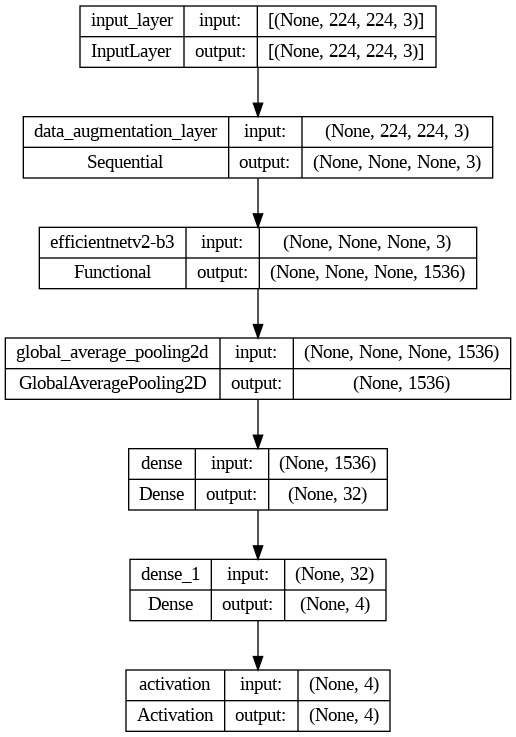

In [12]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [13]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [14]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 77s 275ms/step - loss: 0.6848 - accuracy: 0.7260 - val_loss: 0.4158 - val_accuracy: 0.8353 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 46s 215ms/step - loss: 0.4626 - accuracy: 0.8191 - val_loss: 0.3593 - val_accuracy: 0.8592 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 39s 185ms/step - loss: 0.4240 - accuracy: 0.8393 - val_loss: 0.4876 - val_accuracy: 0.8234 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 40s 191ms/step - loss: 0.3906 - accuracy: 0.8526 - val_loss: 0.3012 - val_accuracy: 0.8974 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 34s 161ms/step - loss: 0.3615 - accuracy: 0.8639 - val_loss: 0.3144 - val_accuracy: 0.8783 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 32s 150ms/step - loss: 0.3459 - accuracy: 0.8633 - val_loss: 0.3659 - val_accuracy: 0.8640 - lr: 0.0010
Epoch 7/20
211/211 [==============================] 

EfficientNetV2B3 Evaluation

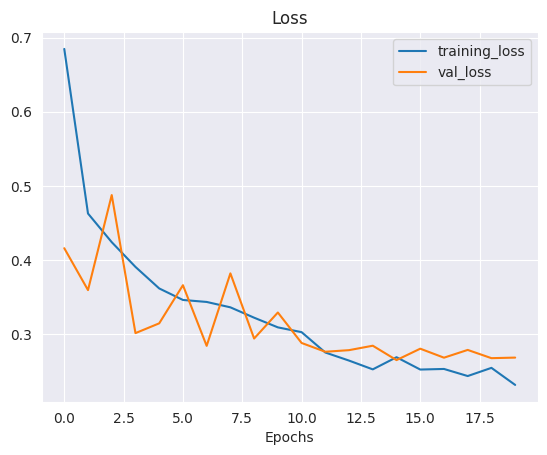

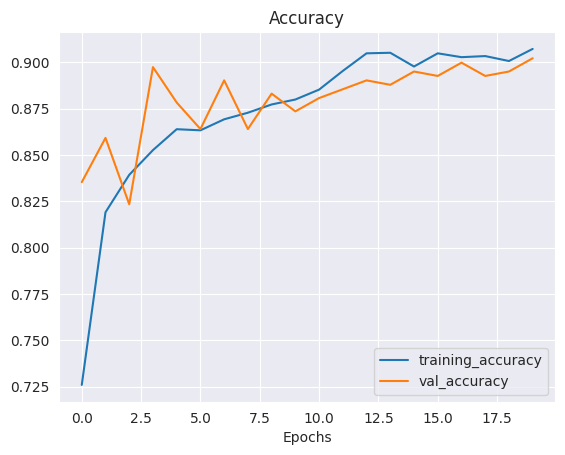

In [15]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 1s 44ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.97      0.95       105
           1       0.98      1.00      0.99       111
           2       0.95      0.80      0.87       102
           3       0.87      0.94      0.91       108

    accuracy                           0.93       426
   macro avg       0.93      0.93      0.93       426
weighted avg       0.93      0.93      0.93       426

Specificity: [0.3148148148148148, 0.3523809523809524, 0.23837209302325582, 0.3148148148148148]
Mean Squared Error: : 0.1070760041475296
The average AUC-ROC is 0.9883733351480046


[0.990506329113924,
 0.6645367412140575,
 0.6941176470588235,
 0.6666666666666666,
 0.6487341772151899,
 1.0,
 0.6735294117647059,
 0.6407766990291263,
 0.6962025316455697,
 0.6773162939297125,
 0.9411764705882353,
 0.7119741100323624,
 0.6645569620253164,
 0.65814696485623,
 0.6911764705882353,
 0.9805825242718447]

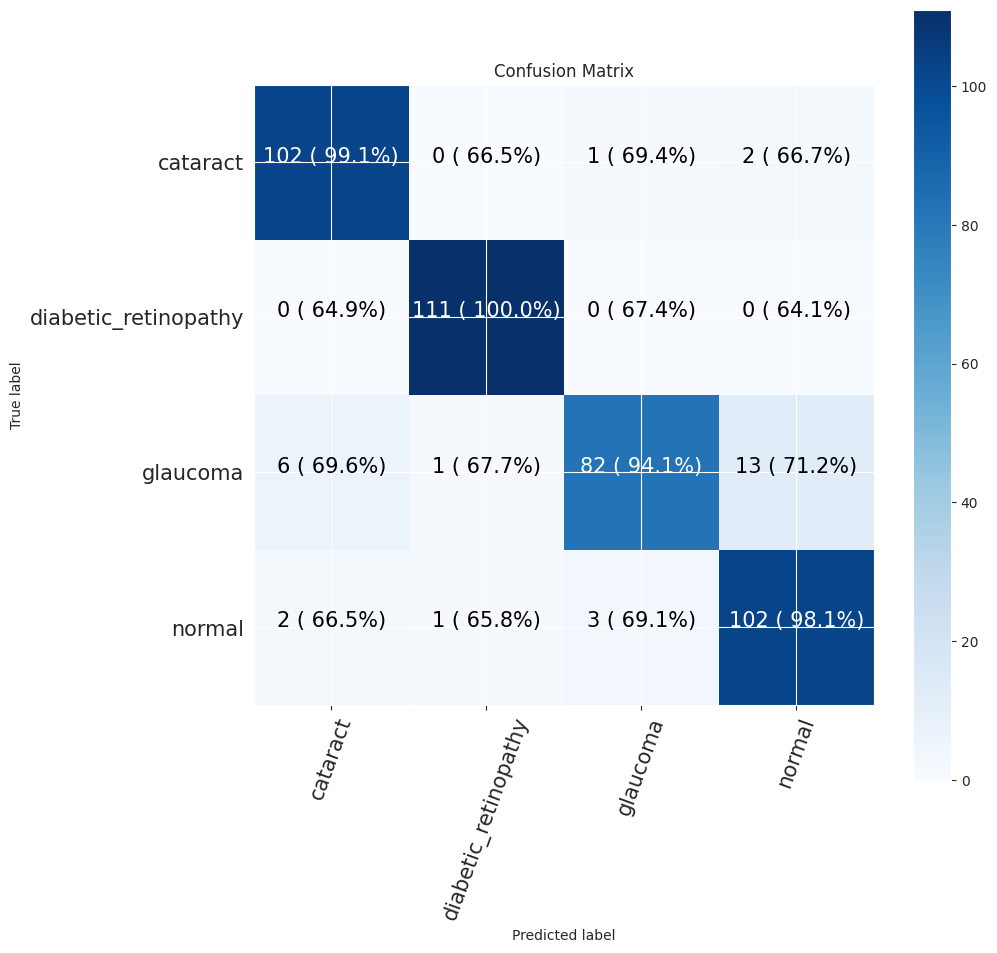

In [16]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


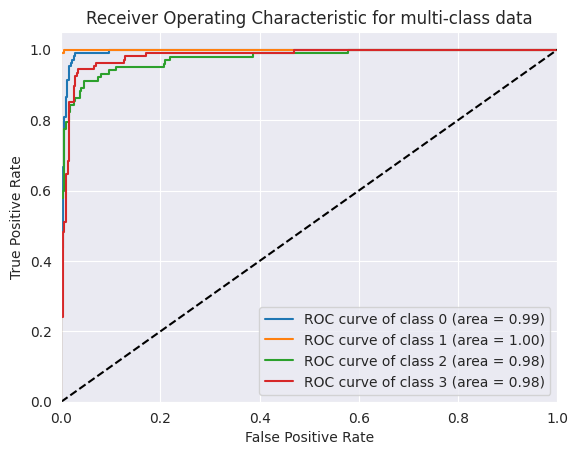

In [17]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [18]:
def grayscale_data_augmentation(image):
    # Convert image to grayscale
    image = tf.image.rgb_to_grayscale(image)

    # Resize the image to 224x224
    image = tf.image.resize(image, [224, 224])

    # Apply random flips
    data_aug(image)

    return image

In [19]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
cnn_model.summary()
# cnn_model = Sequential()

# cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1))) # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# # Flatten the output for dense layers
# cnn_model.add(layers.Flatten())

# # Add dense layers for classification
# cnn_model.add(layers.Dense(512, activation='relu'))
# cnn_model.add(layers.Dense(256, activation='relu'))
# cnn_model.add(layers.Dense(4, activation='softmax')) # Set num_classes to your specific number of classes

# # Display model summary
# cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

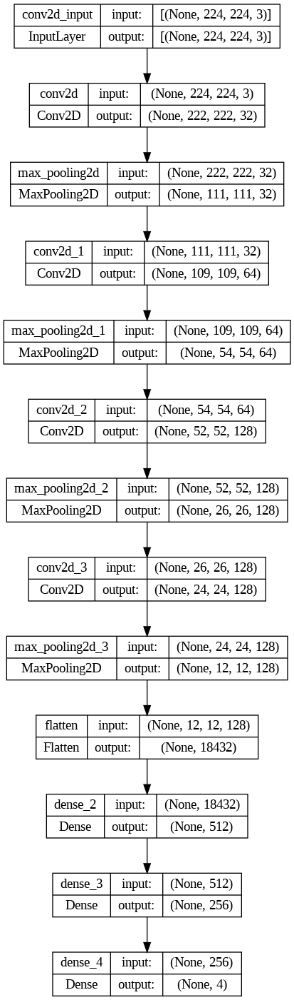

In [20]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [21]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [22]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 10s 25ms/step - loss: 0.7753 - accuracy: 0.5854 - val_loss: 0.3156 - val_accuracy: 0.6850 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 5s 23ms/step - loss: 0.3059 - accuracy: 0.6931 - val_loss: 0.2933 - val_accuracy: 0.7327 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2925 - accuracy: 0.7073 - val_loss: 0.3096 - val_accuracy: 0.7279 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2853 - accuracy: 0.7082 - val_loss: 0.2682 - val_accuracy: 0.7327 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2658 - accuracy: 0.7272 - val_loss: 0.2516 - val_accuracy: 0.7542 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2586 - accuracy: 0.7393 - val_loss: 0.2582 - val_accuracy: 0.7375 - lr: 0.0010
Epoch 7/20
211/211 [==============================] - 5s 23ms/s

CNN Evaluation

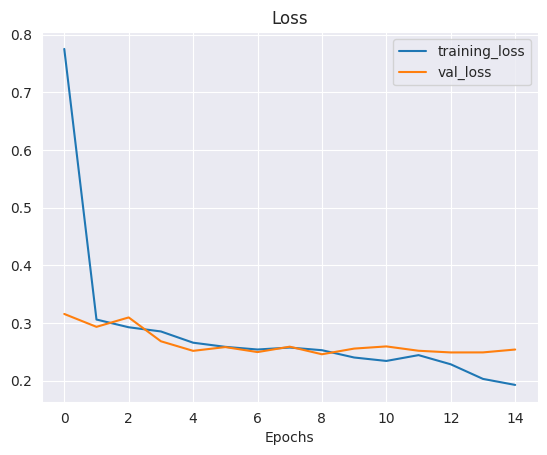

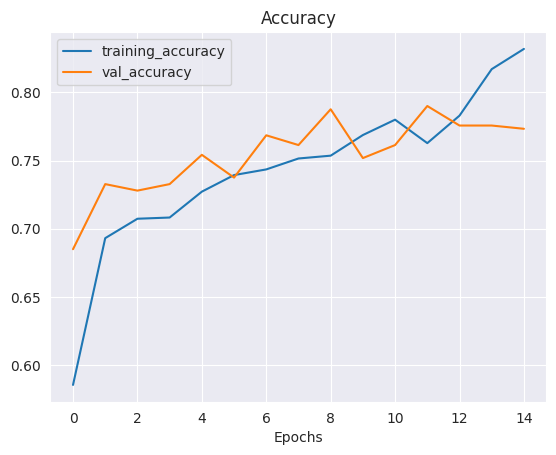

In [23]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 0s 10ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.47      0.54       105
           1       1.00      0.98      0.99       111
           2       0.60      0.57      0.59       102
           3       0.70      0.94      0.80       108

    accuracy                           0.75       426
   macro avg       0.74      0.74      0.73       426
weighted avg       0.74      0.75      0.74       426

Specificity: [0.129973474801061, 0.3438485804416404, 0.15760869565217392, 0.3148148148148148]
Mean Squared Error: : 0.12994101643562317
The average AUC-ROC is 0.9069190702700198


[0.8404558404558404,
 0.668769716088328,
 0.7757575757575758,
 0.7142857142857143,
 0.6837606837606838,
 0.9936908517350158,
 0.6696969696969697,
 0.6035714285714285,
 0.7806267806267806,
 0.6782334384858044,
 0.8666666666666667,
 0.7035714285714286,
 0.6951566951566952,
 0.6593059936908517,
 0.6878787878787879,
 0.9785714285714285]

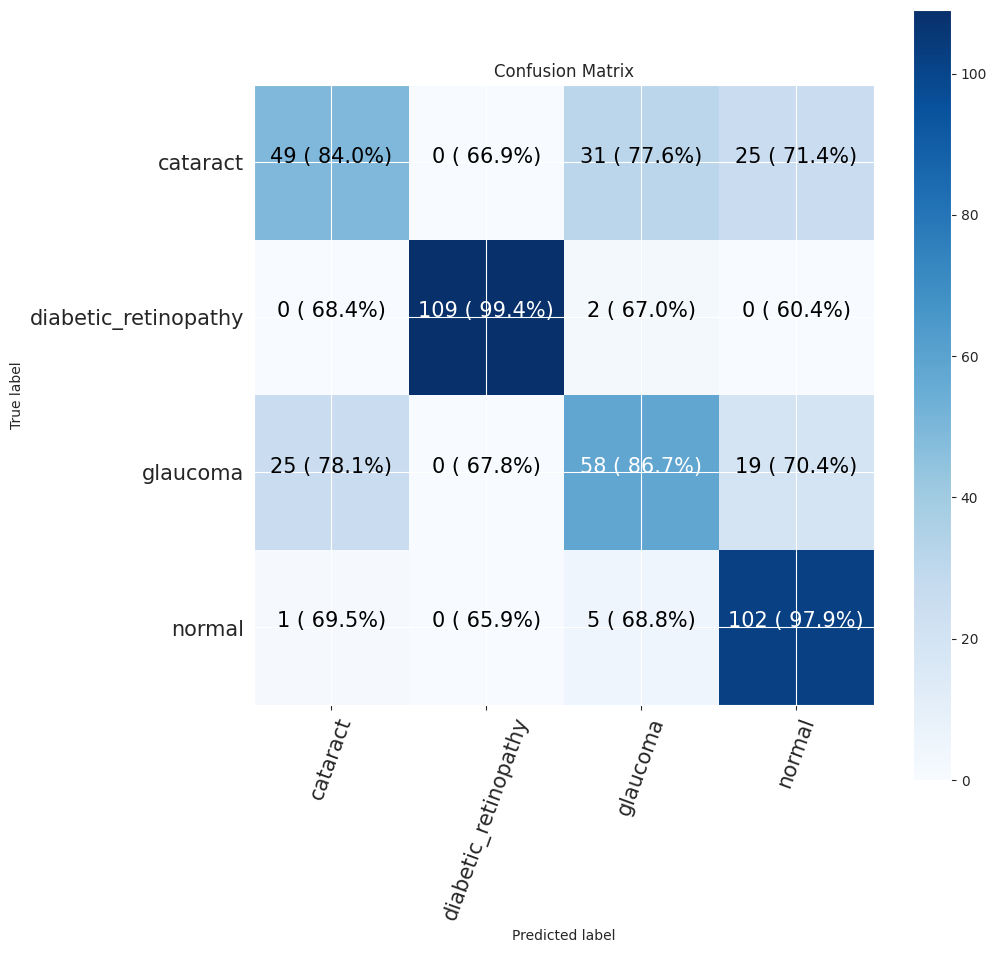

In [24]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


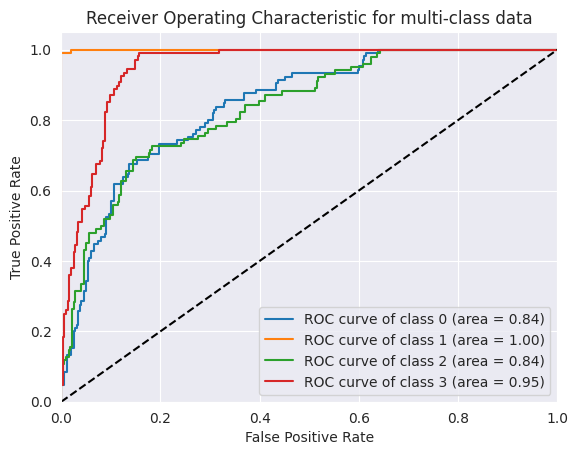

In [25]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [26]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [27]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


94765736/94765736 [==============================] - 5s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 conv2d_4 (Conv2D)           (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_5 (Dense)             (None, 1024)              2098176   
                                                                 
 dense_6 (Dense)             (None, 4)                 4100 

In [28]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

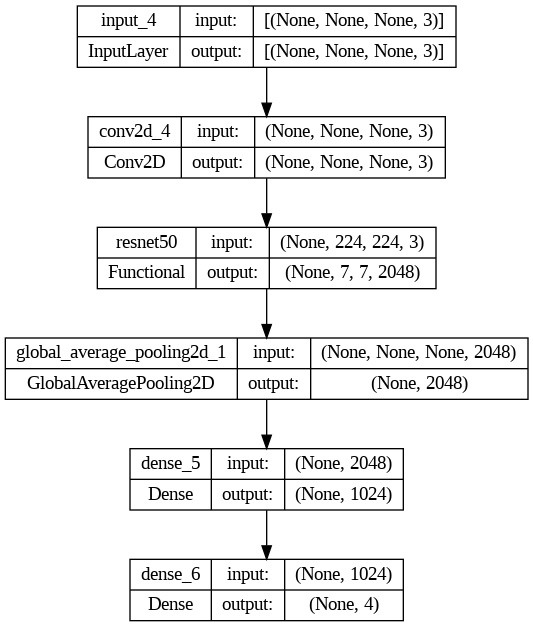

In [29]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [30]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [31]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 37s 149ms/step - loss: 0.2587 - accuracy: 0.7942 - val_loss: 0.1441 - val_accuracy: 0.9045 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 29s 136ms/step - loss: 0.1705 - accuracy: 0.8648 - val_loss: 0.1341 - val_accuracy: 0.8998 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 29s 136ms/step - loss: 0.1447 - accuracy: 0.8808 - val_loss: 0.1167 - val_accuracy: 0.9093 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 29s 137ms/step - loss: 0.1233 - accuracy: 0.8992 - val_loss: 0.1180 - val_accuracy: 0.9141 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 29s 137ms/step - loss: 0.1176 - accuracy: 0.9015 - val_loss: 0.1140 - val_accuracy: 0.9260 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 29s 136ms/step - loss: 0.1073 - accuracy: 0.9155 - val_loss: 0.1281 - val_accuracy: 0.8998 - lr: 0.0010
Epoch 7/20
211/211 [==============================] 

ResNet50 Evaluation

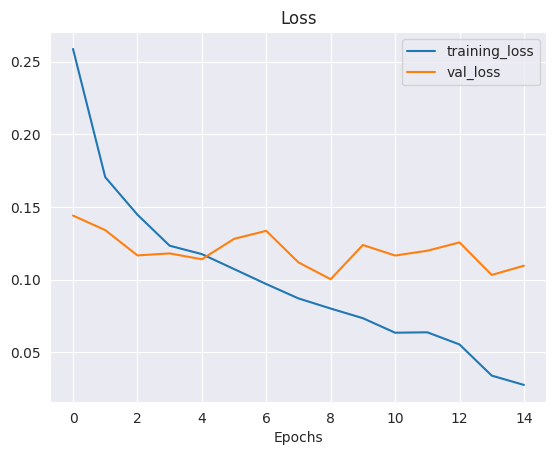

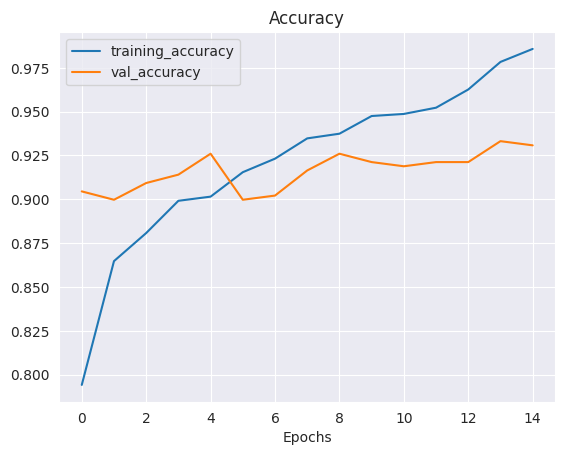

In [32]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 1s 49ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.97      0.94       105
           1       1.00      0.99      1.00       111
           2       0.92      0.86      0.89       102
           3       0.88      0.88      0.88       108

    accuracy                           0.93       426
   macro avg       0.93      0.93      0.93       426
weighted avg       0.93      0.93      0.93       426

Specificity: [0.3148148148148148, 0.34810126582278483, 0.2603550295857988, 0.28700906344410876]
Mean Squared Error: : 0.10258489847183228
The average AUC-ROC is 0.9909458235103459


[0.9904458598726115,
 0.6677215189873418,
 0.6848484848484848,
 0.6761006289308176,
 0.6496815286624203,
 0.9968354430379747,
 0.6636363636363637,
 0.6509433962264151,
 0.6847133757961783,
 0.6772151898734177,
 0.9575757575757575,
 0.7138364779874213,
 0.6751592356687898,
 0.6582278481012658,
 0.693939393939394,
 0.9591194968553459]

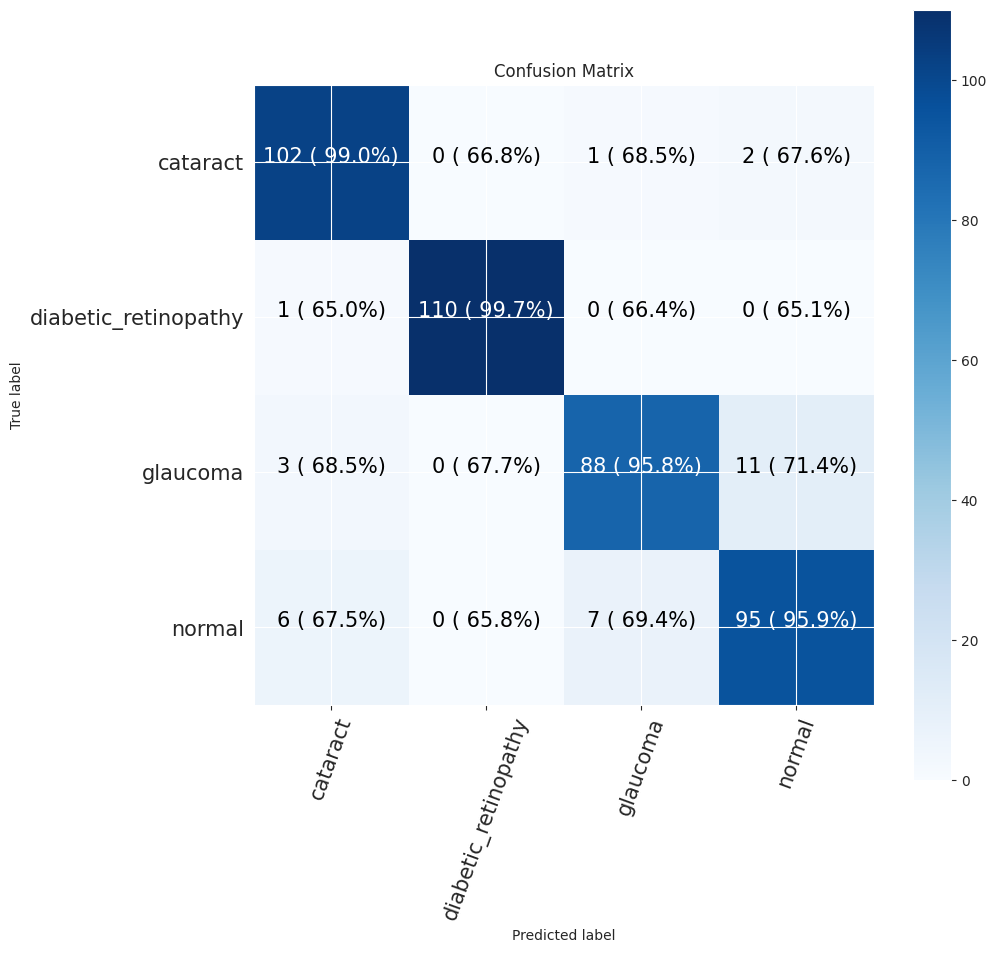

In [33]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


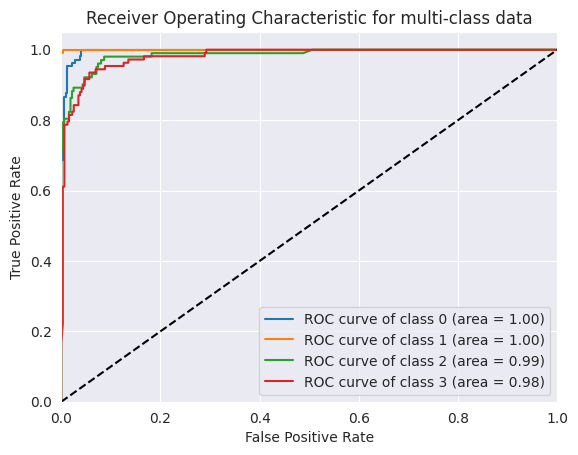

In [34]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [35]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [36]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

171446536/171446536 [==============================] - 8s 0us/step


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



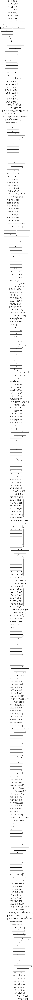

In [37]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [38]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_7 (Dense)             (None, 32)                65568     
                                                           

In [39]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [40]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 95s 419ms/step - loss: 0.6282 - accuracy: 0.7450 - val_loss: 0.5624 - val_accuracy: 0.7828 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 55s 261ms/step - loss: 0.4412 - accuracy: 0.8372 - val_loss: 0.4112 - val_accuracy: 0.8520 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 46s 219ms/step - loss: 0.3908 - accuracy: 0.8511 - val_loss: 0.4220 - val_accuracy: 0.8687 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 40s 187ms/step - loss: 0.3404 - accuracy: 0.8704 - val_loss: 0.3281 - val_accuracy: 0.8735 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 34s 161ms/step - loss: 0.3278 - accuracy: 0.8680 - val_loss: 0.5527 - val_accuracy: 0.8138 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 33s 156ms/step - loss: 0.3146 - accuracy: 0.8784 - val_loss: 0.4002 - val_accuracy: 0.8663 - lr: 0.0010
Epoch 7/20
211/211 [==============================] 

ResNet50 Evaluation

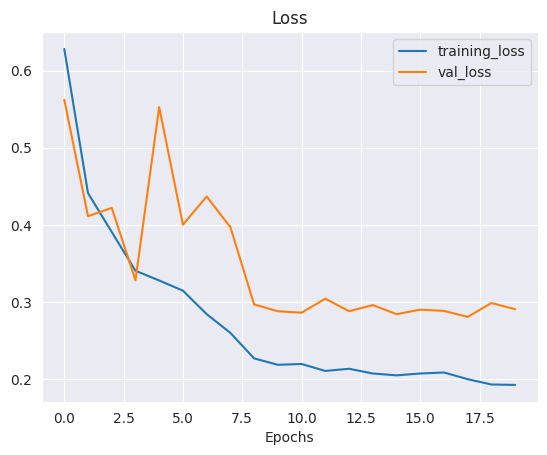

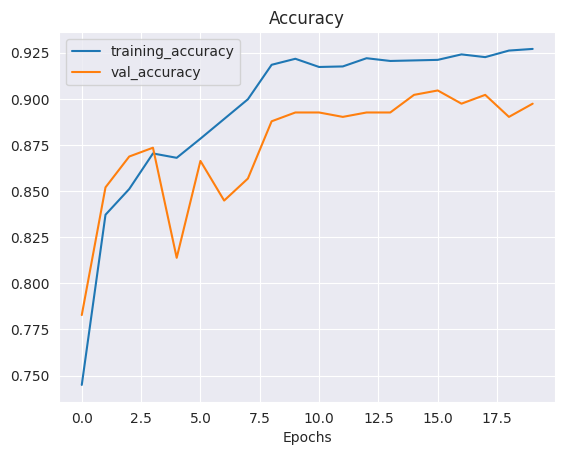

In [41]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


27/27 [==============================] - 2s 81ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       105
           1       0.95      0.99      0.97       111
           2       0.89      0.82      0.86       102
           3       0.85      0.88      0.86       108

    accuracy                           0.91       426
   macro avg       0.91      0.91      0.91       426
weighted avg       0.91      0.91      0.91       426

Specificity: [0.30275229357798167, 0.34810126582278483, 0.24561403508771928, 0.28700906344410876]
Mean Squared Error: : 0.10875127464532852
The average AUC-ROC is 0.9886878182945608


[0.9813664596273292,
 0.6612903225806451,
 0.6987951807228916,
 0.6687898089171974,
 0.65527950310559,
 0.9967741935483871,
 0.6656626506024096,
 0.6496815286624203,
 0.6863354037267081,
 0.6774193548387096,
 0.9457831325301205,
 0.7229299363057324,
 0.6770186335403726,
 0.6645161290322581,
 0.6897590361445783,
 0.9585987261146497]

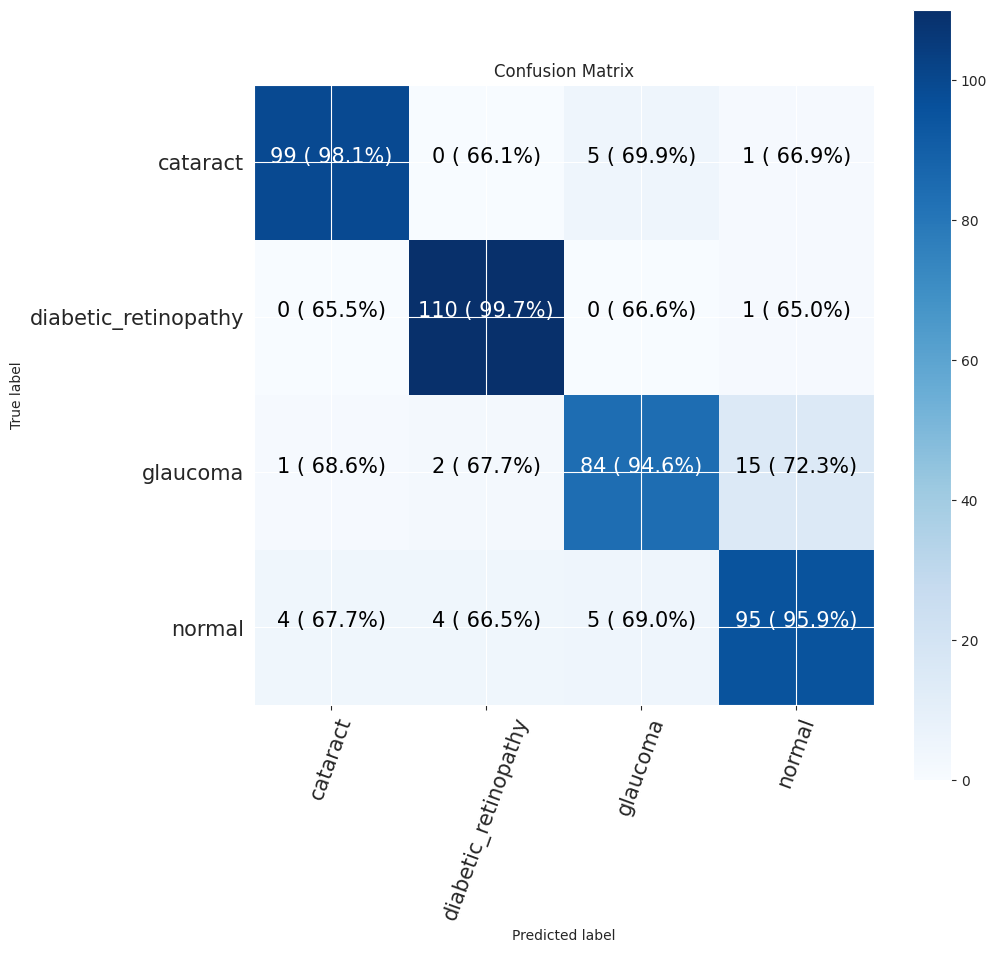

In [42]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


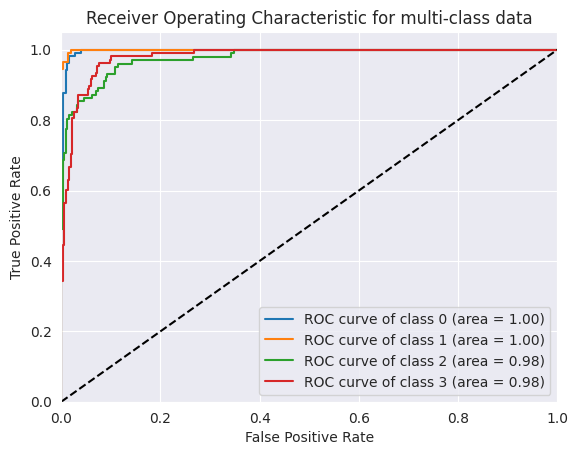

In [43]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch size: 32**

In [44]:
epoch = 20
batchsize = 32

In [45]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 419 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [46]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [47]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_3  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_9 (Dense)             (None, 32)                49184     
                                                           

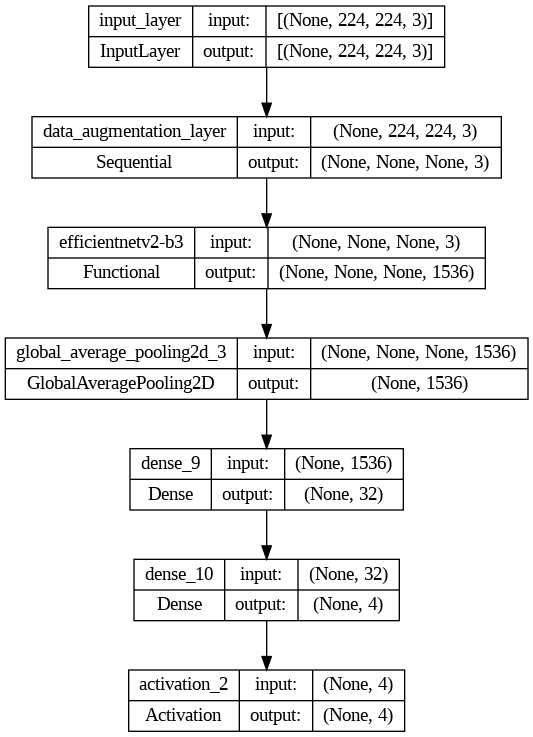

In [48]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [49]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [50]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 64s 495ms/step - loss: 0.6591 - accuracy: 0.7375 - val_loss: 0.4021 - val_accuracy: 0.8496 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 43s 404ms/step - loss: 0.4835 - accuracy: 0.8105 - val_loss: 0.3715 - val_accuracy: 0.8687 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 41s 392ms/step - loss: 0.4304 - accuracy: 0.8283 - val_loss: 0.3130 - val_accuracy: 0.8950 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 39s 365ms/step - loss: 0.4007 - accuracy: 0.8443 - val_loss: 0.3643 - val_accuracy: 0.8616 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 33s 309ms/step - loss: 0.3663 - accuracy: 0.8562 - val_loss: 0.3480 - val_accuracy: 0.8663 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 35s 328ms/step - loss: 0.3440 - accuracy: 0.8627 - val_loss: 0.3038 - val_accuracy: 0.8878 - lr: 0.0010
Epoch 7/20
106/106 [==============================] 

EfficientNetV2B3 Evaluation

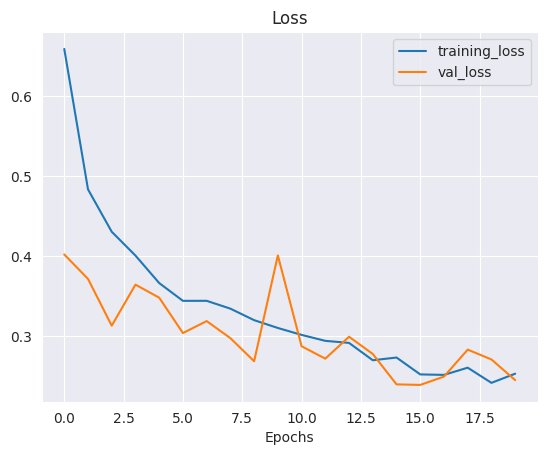

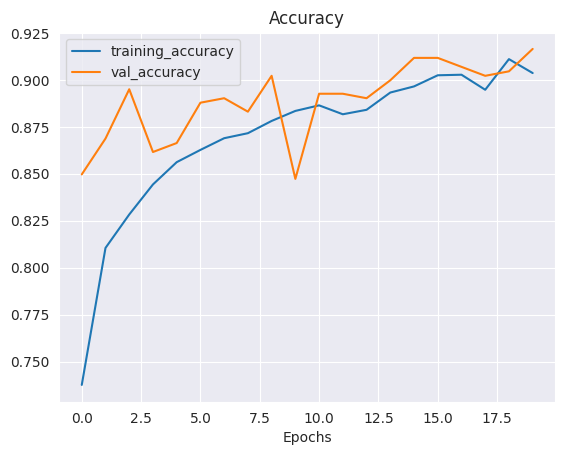

In [51]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 79ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.96       105
           1       0.96      0.99      0.98       111
           2       0.94      0.81      0.87       102
           3       0.88      0.94      0.91       108

    accuracy                           0.93       426
   macro avg       0.93      0.93      0.93       426
weighted avg       0.93      0.93      0.93       426

Specificity: [0.3148148148148148, 0.34810126582278483, 0.24198250728862974, 0.3148148148148148]
Mean Squared Error: : 0.1074741780757904
The average AUC-ROC is 0.987526742315396


[0.9905660377358491,
 0.6634615384615384,
 0.6952662721893491,
 0.6645161290322581,
 0.6509433962264151,
 0.9967948717948718,
 0.6715976331360947,
 0.6451612903225806,
 0.6949685534591195,
 0.6794871794871795,
 0.9437869822485208,
 0.7096774193548387,
 0.6635220125786163,
 0.6602564102564102,
 0.6893491124260355,
 0.9806451612903225]

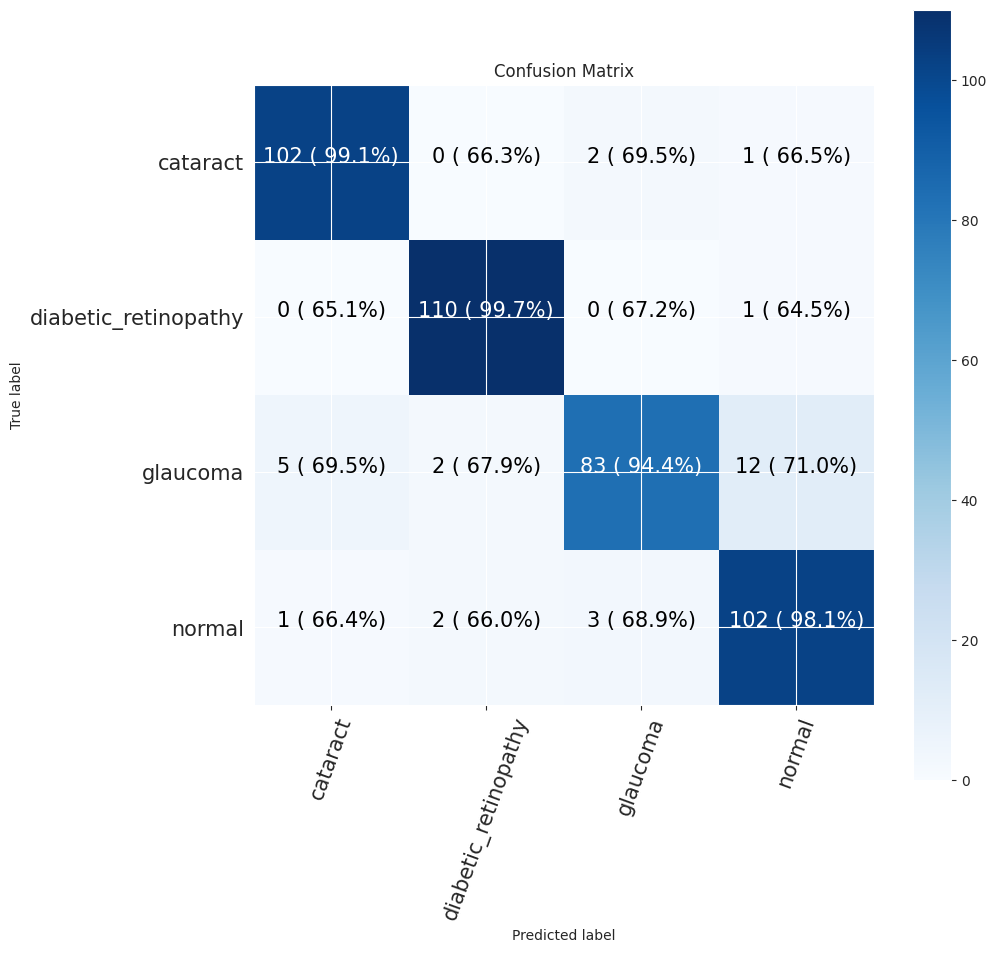

In [52]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


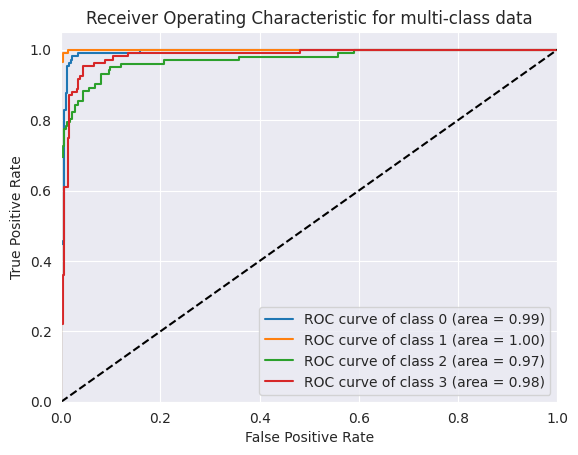

In [53]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [54]:
def grayscale_data_augmentation(image):
    # Convert image to grayscale
    image = tf.image.rgb_to_grayscale(image)

    # Resize the image to 224x224
    image = tf.image.resize(image, [224, 224])

    # Apply random flips
    data_aug(image)

    return image

In [55]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
cnn_model.summary()
# cnn_model = Sequential()

# cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1))) # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# # Flatten the output for dense layers
# cnn_model.add(layers.Flatten())

# # Add dense layers for classification
# cnn_model.add(layers.Dense(512, activation='relu'))
# cnn_model.add(layers.Dense(256, activation='relu'))
# cnn_model.add(layers.Dense(4, activation='softmax')) # Set num_classes to your specific number of classes

# # Display model summary
# cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 26, 26, 128)      

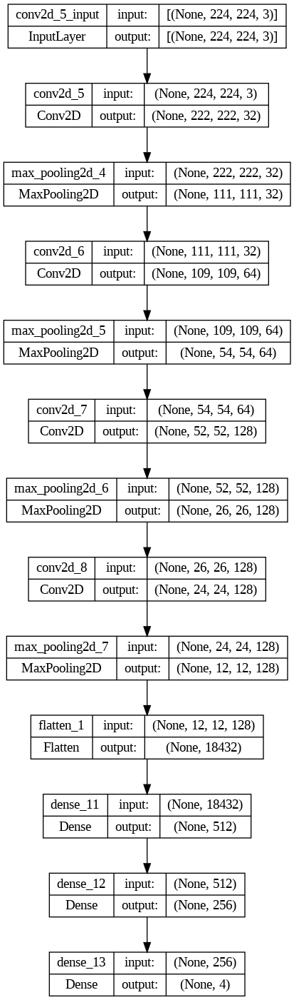

In [56]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [57]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [58]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 7s 41ms/step - loss: 1.2890 - accuracy: 0.5629 - val_loss: 0.3453 - val_accuracy: 0.6826 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 4s 40ms/step - loss: 0.3049 - accuracy: 0.6818 - val_loss: 0.2836 - val_accuracy: 0.7661 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 5s 40ms/step - loss: 0.2842 - accuracy: 0.7153 - val_loss: 0.2853 - val_accuracy: 0.7351 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 4s 40ms/step - loss: 0.2711 - accuracy: 0.7367 - val_loss: 0.2507 - val_accuracy: 0.7757 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 5s 40ms/step - loss: 0.2620 - accuracy: 0.7473 - val_loss: 0.2561 - val_accuracy: 0.7733 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 5s 40ms/step - loss: 0.2571 - accuracy: 0.7491 - val_loss: 0.2472 - val_accuracy: 0.7804 - lr: 0.0010
Epoch 7/20
106/106 [==============================] - 4s 40ms/st

CNN Evaluation

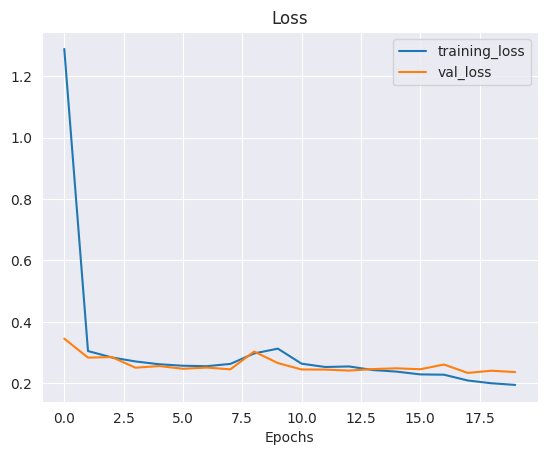

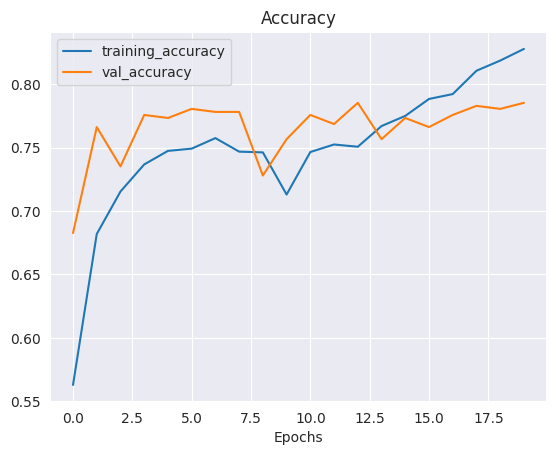

In [59]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 0s 18ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.46      0.52       105
           1       0.99      0.99      0.99       111
           2       0.55      0.55      0.55       102
           3       0.71      0.87      0.78       108

    accuracy                           0.72       426
   macro avg       0.71      0.72      0.71       426
weighted avg       0.72      0.72      0.72       426

Specificity: [0.12698412698412698, 0.34810126582278483, 0.15135135135135136, 0.28313253012048195]
Mean Squared Error: : 0.1328202486038208
The average AUC-ROC is 0.8945028582963689


[0.8352601156069365,
 0.6666666666666666,
 0.7839506172839507,
 0.7167235494880546,
 0.6791907514450867,
 0.9968253968253968,
 0.6604938271604939,
 0.621160409556314,
 0.7890173410404624,
 0.6761904761904762,
 0.8580246913580247,
 0.7098976109215017,
 0.6965317919075145,
 0.6603174603174603,
 0.6975308641975309,
 0.9522184300341296]

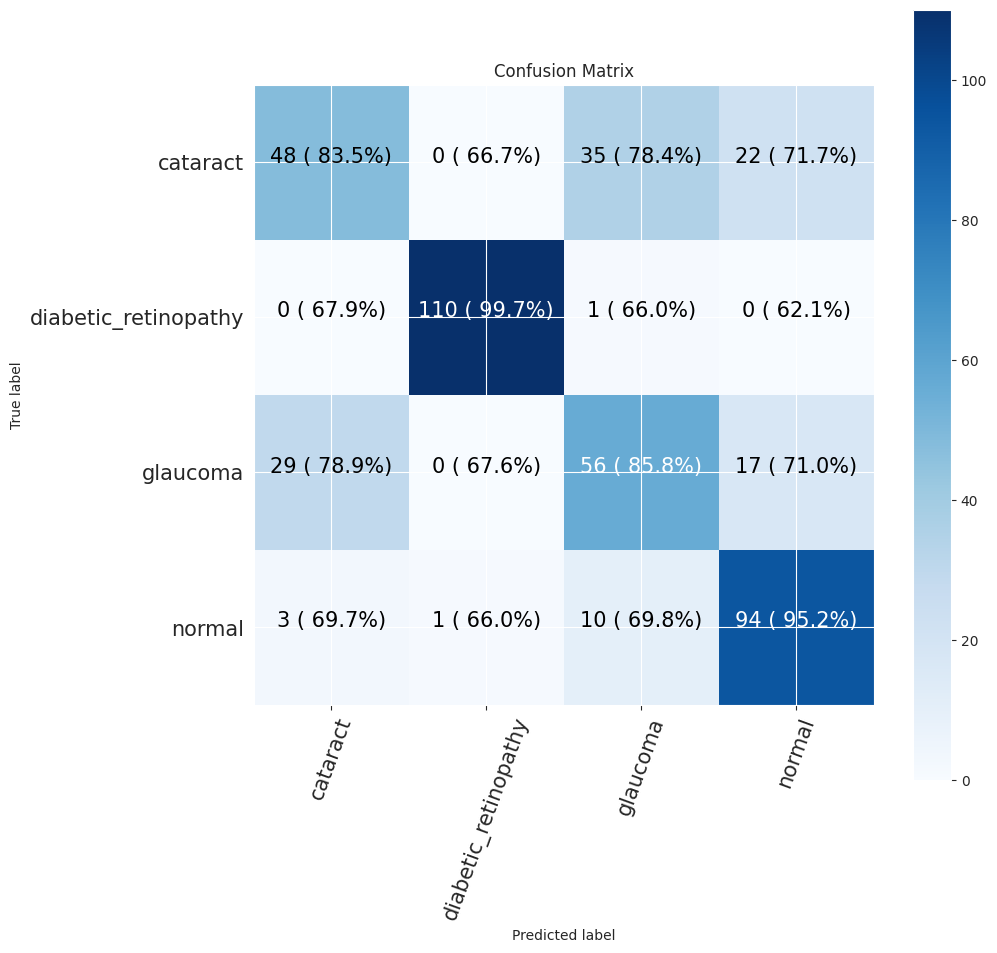

In [60]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


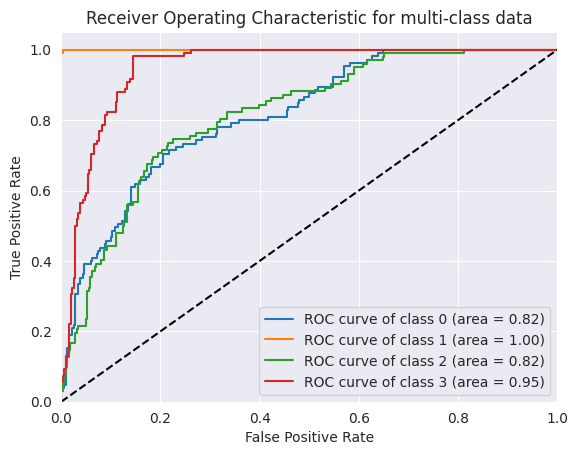

In [61]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [62]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [63]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 conv2d_9 (Conv2D)           (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_4  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_14 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_15 (Dense)            (None, 4)                 4100      
                                                           

In [64]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

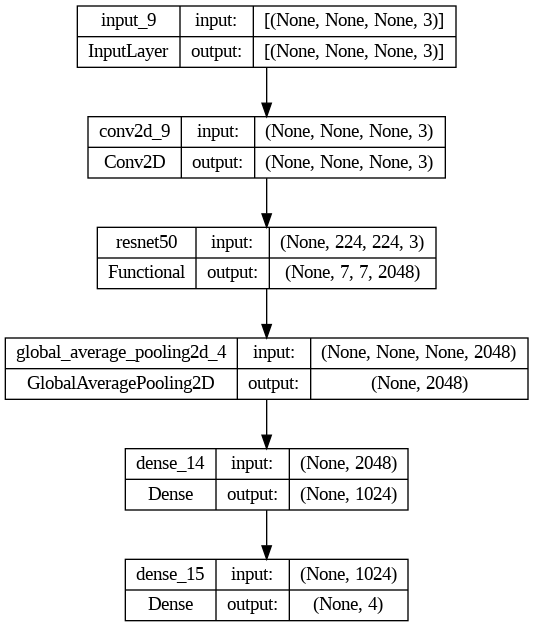

In [65]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [66]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [67]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 34s 267ms/step - loss: 0.2955 - accuracy: 0.7740 - val_loss: 0.1724 - val_accuracy: 0.8711 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 27s 258ms/step - loss: 0.1724 - accuracy: 0.8671 - val_loss: 0.1755 - val_accuracy: 0.8568 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 27s 257ms/step - loss: 0.1493 - accuracy: 0.8867 - val_loss: 0.1424 - val_accuracy: 0.8831 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 28s 258ms/step - loss: 0.1308 - accuracy: 0.8992 - val_loss: 0.1261 - val_accuracy: 0.9069 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 27s 257ms/step - loss: 0.1198 - accuracy: 0.9072 - val_loss: 0.1186 - val_accuracy: 0.9093 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 27s 257ms/step - loss: 0.1084 - accuracy: 0.9217 - val_loss: 0.1186 - val_accuracy: 0.9093 - lr: 0.0010
Epoch 7/20
106/106 [==============================] 

ResNet50 Evaluation

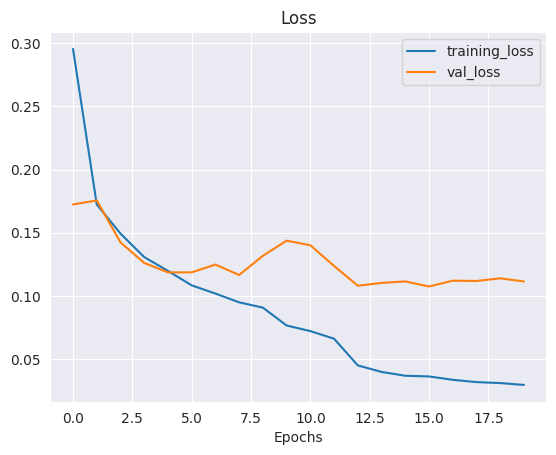

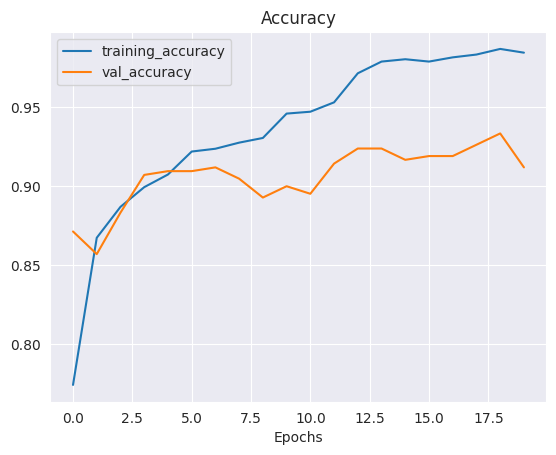

In [68]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 1s 93ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       105
           1       1.00      0.98      0.99       111
           2       0.81      0.91      0.86       102
           3       0.89      0.79      0.83       108

    accuracy                           0.91       426
   macro avg       0.91      0.91      0.90       426
weighted avg       0.91      0.91      0.91       426

Specificity: [0.30275229357798167, 0.3438485804416404, 0.27927927927927926, 0.24926686217008798]
Mean Squared Error: : 0.10464654862880707
The average AUC-ROC is 0.9870510405126018


[0.98125,
 0.668769716088328,
 0.6720257234726688,
 0.6909090909090909,
 0.653125,
 0.9936908517350158,
 0.6495176848874598,
 0.6636363636363637,
 0.684375,
 0.6782334384858044,
 0.9710610932475884,
 0.7151515151515152,
 0.68125,
 0.6593059936908517,
 0.707395498392283,
 0.9303030303030303]

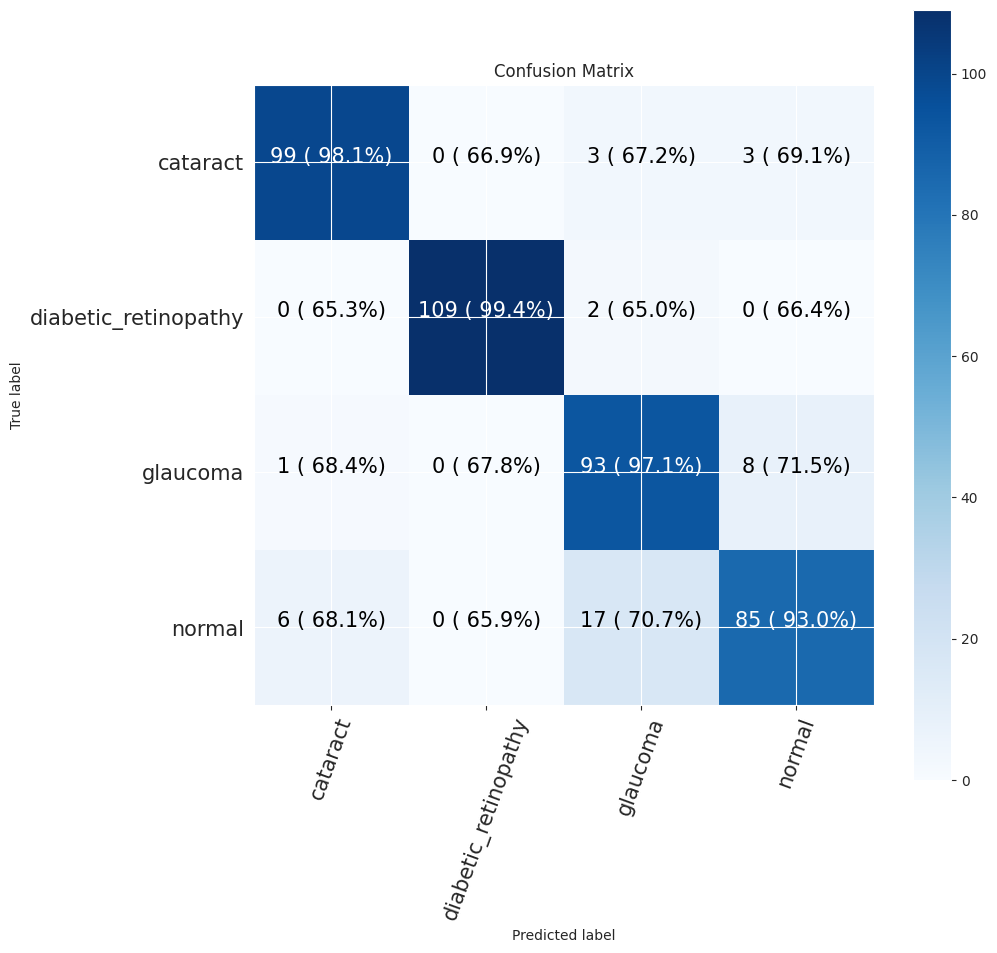

In [69]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


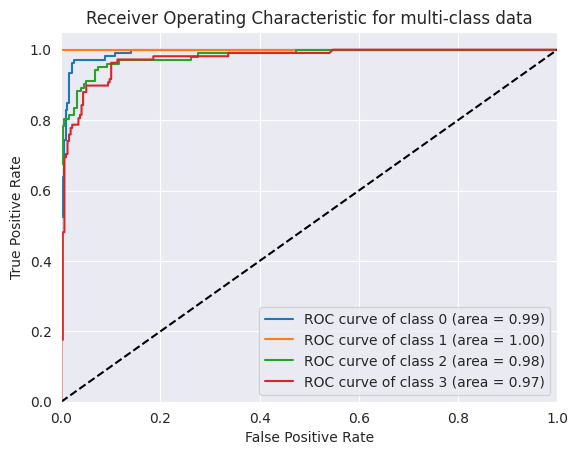

In [70]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [71]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [72]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



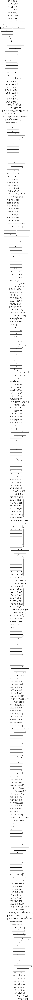

In [73]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [74]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_5  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_16 (Dense)            (None, 32)                65568     
                                                           

In [75]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [76]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 90s 775ms/step - loss: 0.6468 - accuracy: 0.7396 - val_loss: 0.5008 - val_accuracy: 0.7924 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 61s 572ms/step - loss: 0.4449 - accuracy: 0.8271 - val_loss: 0.4198 - val_accuracy: 0.8353 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 49s 463ms/step - loss: 0.3926 - accuracy: 0.8461 - val_loss: 0.4262 - val_accuracy: 0.8282 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 42s 400ms/step - loss: 0.3514 - accuracy: 0.8657 - val_loss: 0.3999 - val_accuracy: 0.8544 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 39s 365ms/step - loss: 0.3269 - accuracy: 0.8728 - val_loss: 0.3387 - val_accuracy: 0.8759 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 38s 352ms/step - loss: 0.3176 - accuracy: 0.8751 - val_loss: 0.3877 - val_accuracy: 0.8711 - lr: 0.0010
Epoch 7/20
106/106 [==============================] 

ResNet50 Evaluation

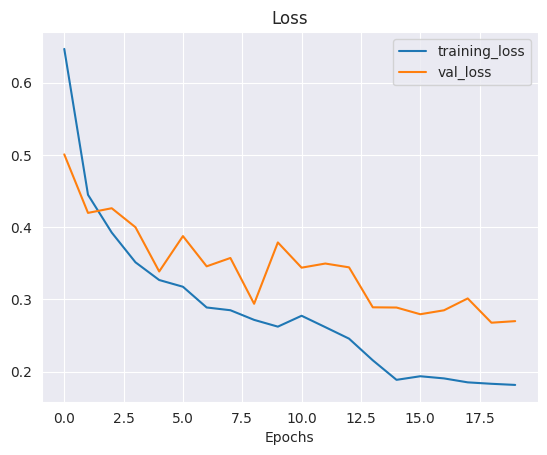

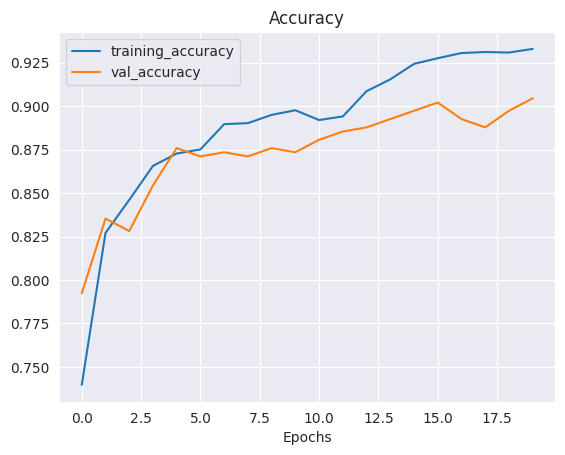

In [77]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


14/14 [==============================] - 2s 154ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.90      0.92       105
           1       0.96      0.98      0.97       111
           2       0.84      0.85      0.84       102
           3       0.85      0.87      0.86       108

    accuracy                           0.90       426
   macro avg       0.90      0.90      0.90       426
weighted avg       0.90      0.90      0.90       426

Specificity: [0.28313253012048195, 0.3438485804416404, 0.25663716814159293, 0.28313253012048195]
Mean Squared Error: : 0.10896387696266174
The average AUC-ROC is 0.9881029139443048


[0.9663608562691132,
 0.6645367412140575,
 0.7049689440993789,
 0.6708860759493671,
 0.6605504587155964,
 0.9936102236421726,
 0.65527950310559,
 0.6550632911392406,
 0.691131498470948,
 0.6773162939297125,
 0.953416149068323,
 0.7183544303797469,
 0.6819571865443425,
 0.6645367412140575,
 0.6863354037267081,
 0.9556962025316456]

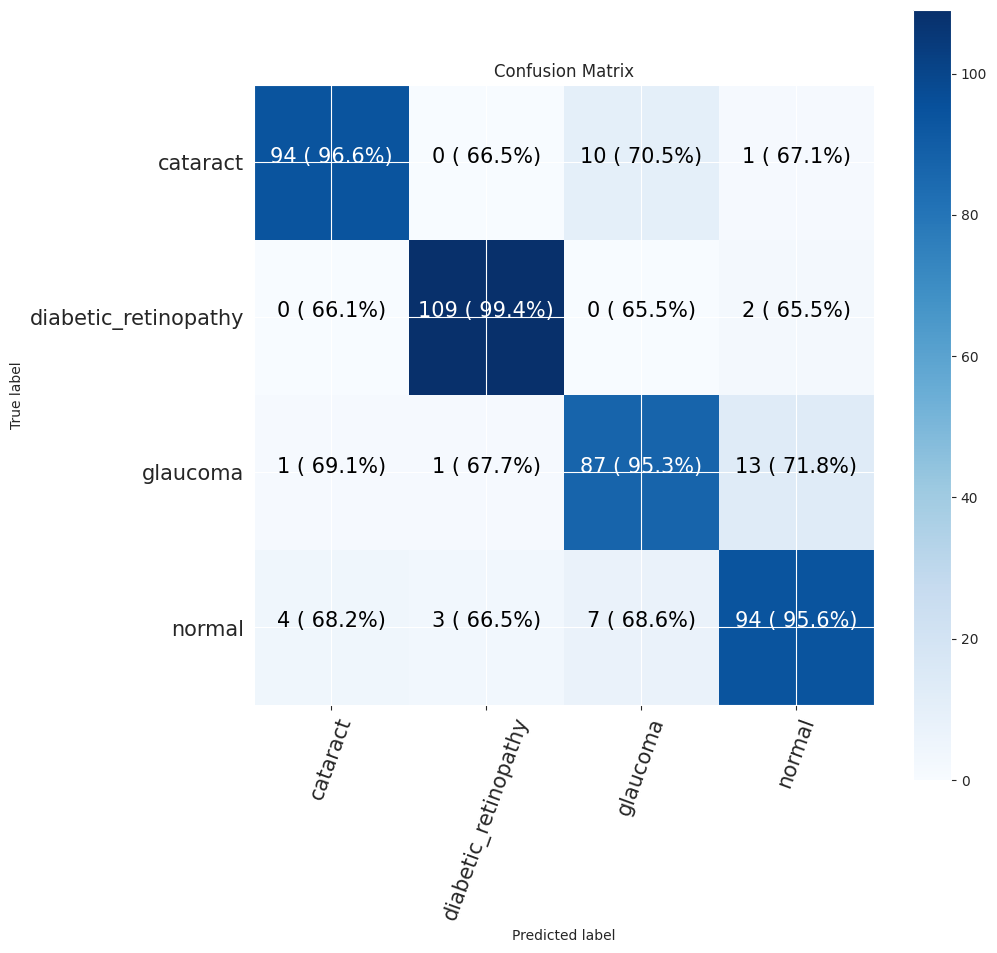

In [78]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


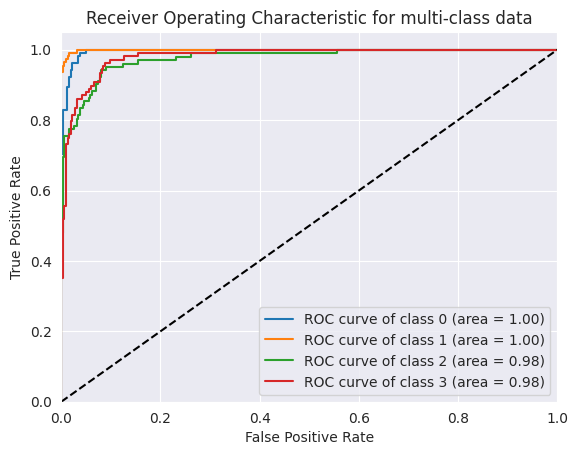

In [79]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch size: 64**

In [80]:
epoch = 20
batchsize = 64


In [81]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 426 files belonging to 4 classes.
Found 419 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [82]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [83]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_6  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_18 (Dense)            (None, 32)                49184     
                                                           

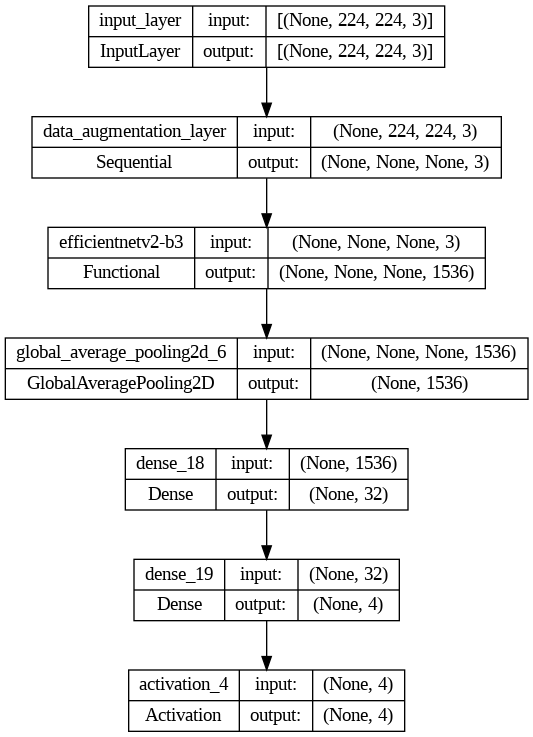

In [84]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [85]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [86]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 63s 993ms/step - loss: 0.7626 - accuracy: 0.6809 - val_loss: 0.4755 - val_accuracy: 0.8258 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 43s 801ms/step - loss: 0.4970 - accuracy: 0.8084 - val_loss: 0.3762 - val_accuracy: 0.8640 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 41s 769ms/step - loss: 0.4523 - accuracy: 0.8283 - val_loss: 0.4022 - val_accuracy: 0.8496 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 39s 730ms/step - loss: 0.4063 - accuracy: 0.8485 - val_loss: 0.3988 - val_accuracy: 0.8473 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 39s 738ms/step - loss: 0.3959 - accuracy: 0.8517 - val_loss: 0.4005 - val_accuracy: 0.8258 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 36s 671ms/step - loss: 0.3845 - accuracy: 0.8553 - val_loss: 0.3567 - val_accuracy: 0.8735 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 42s 781ms/st

EfficientNetV2B3 Evaluation

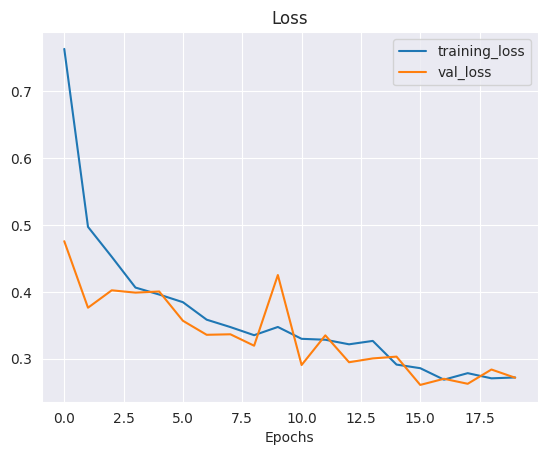

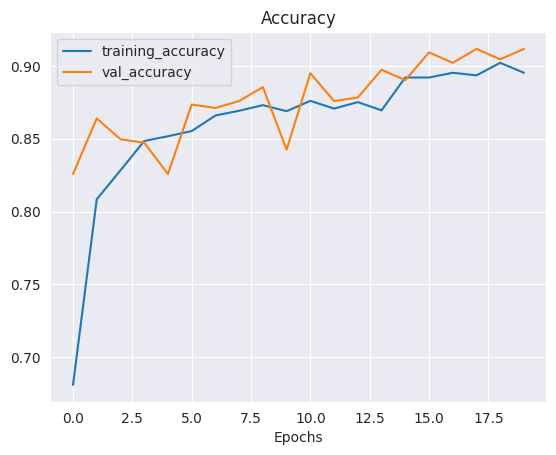

In [87]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 152ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       105
           1       0.96      0.97      0.97       111
           2       0.95      0.82      0.88       102
           3       0.84      0.94      0.89       108

    accuracy                           0.92       426
   macro avg       0.93      0.92      0.92       426
weighted avg       0.93      0.92      0.92       426

Specificity: [0.30275229357798167, 0.33962264150943394, 0.24561403508771928, 0.3148148148148148]
Mean Squared Error: : 0.1092396005988121
The average AUC-ROC is 0.9853876739085987


[0.9813084112149533,
 0.6656050955414012,
 0.6952662721893491,
 0.6688524590163935,
 0.6542056074766355,
 0.9904458598726115,
 0.6715976331360947,
 0.6459016393442623,
 0.6947040498442367,
 0.6815286624203821,
 0.9467455621301775,
 0.7049180327868853,
 0.6697819314641744,
 0.6624203821656051,
 0.6863905325443787,
 0.980327868852459]

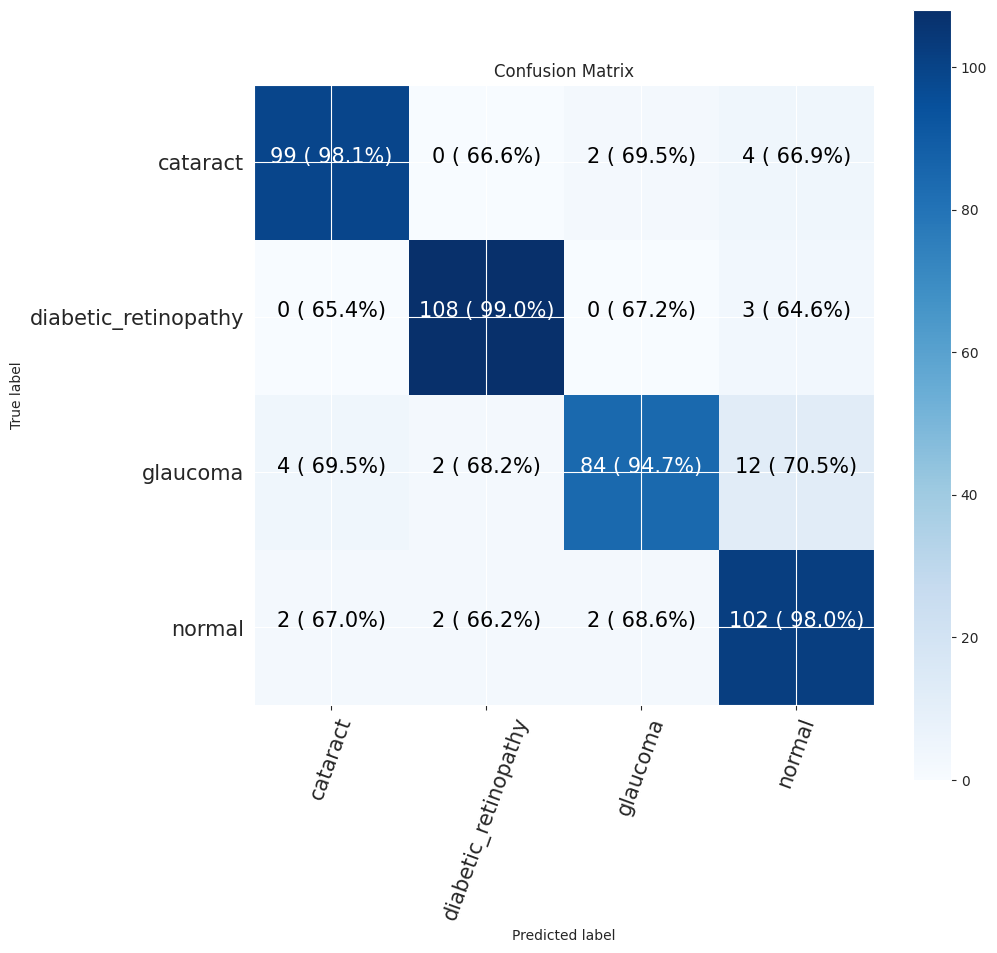

In [88]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


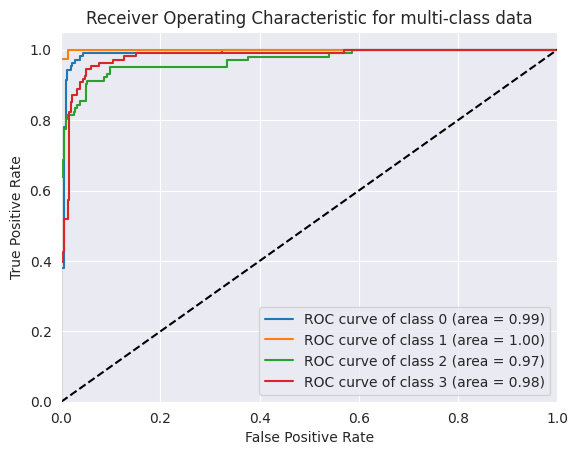

In [89]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [90]:
def grayscale_data_augmentation(image):
    # Convert image to grayscale
    image = tf.image.rgb_to_grayscale(image)

    # Resize the image to 224x224
    image = tf.image.resize(image, [224, 224])

    # Apply random flips
    data_aug(image)

    return image

In [91]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
cnn_model.summary()
# cnn_model = Sequential()

# cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1))) # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# # Flatten the output for dense layers
# cnn_model.add(layers.Flatten())

# # Add dense layers for classification
# cnn_model.add(layers.Dense(512, activation='relu'))
# cnn_model.add(layers.Dense(256, activation='relu'))
# cnn_model.add(layers.Dense(4, activation='softmax')) # Set num_classes to your specific number of classes

# # Display model summary
# cnn_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 26, 26, 128)      

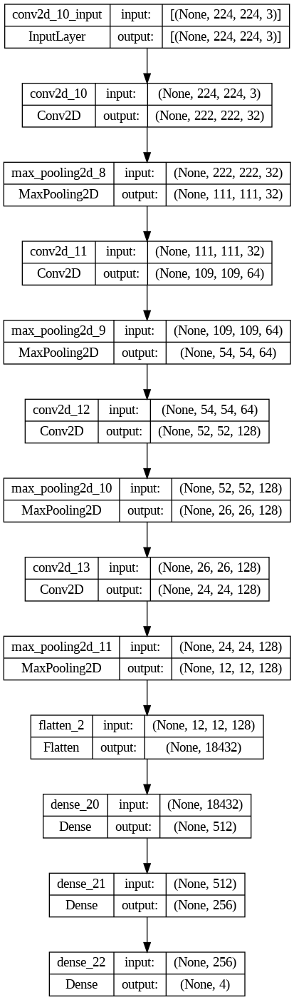

In [92]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [93]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [94]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 8s 97ms/step - loss: 4.1025 - accuracy: 0.4614 - val_loss: 0.3881 - val_accuracy: 0.5823 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 4s 72ms/step - loss: 0.3377 - accuracy: 0.6595 - val_loss: 0.2752 - val_accuracy: 0.7494 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 4s 72ms/step - loss: 0.2831 - accuracy: 0.7239 - val_loss: 0.2876 - val_accuracy: 0.7088 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 4s 73ms/step - loss: 0.2453 - accuracy: 0.7636 - val_loss: 0.2289 - val_accuracy: 0.7876 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 4s 73ms/step - loss: 0.2428 - accuracy: 0.7743 - val_loss: 0.2443 - val_accuracy: 0.7661 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 4s 73ms/step - loss: 0.2344 - accuracy: 0.7814 - val_loss: 0.2164 - val_accuracy: 0.8067 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 4s 73ms/step - loss: 0.2

CNN Evaluation

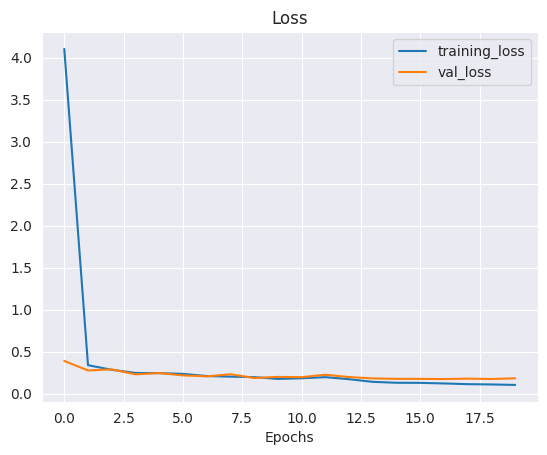

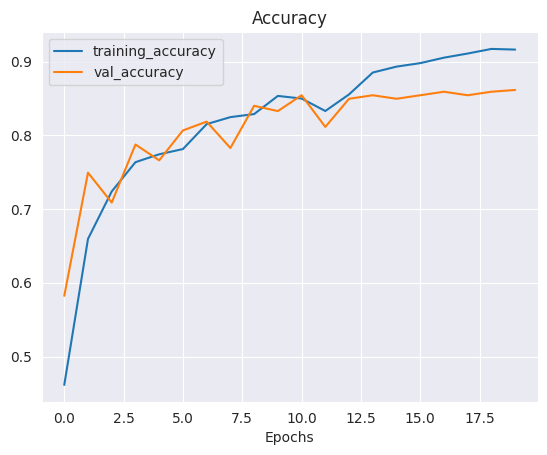

In [95]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 0s 37ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.81      0.81       105
           1       1.00      1.00      1.00       111
           2       0.74      0.78      0.76       102
           3       0.83      0.80      0.82       108

    accuracy                           0.85       426
   macro avg       0.85      0.85      0.85       426
weighted avg       0.85      0.85      0.85       426

Specificity: [0.24926686217008798, 0.3523809523809524, 0.23121387283236994, 0.2529411764705882]
Mean Squared Error: : 0.11648740619421005
The average AUC-ROC is 0.9547755230156441


[0.937888198757764,
 0.6666666666666666,
 0.7138364779874213,
 0.6934984520123839,
 0.65527950310559,
 1.0,
 0.6509433962264151,
 0.6563467492260062,
 0.717391304347826,
 0.6761904761904762,
 0.9308176100628931,
 0.718266253869969,
 0.6894409937888198,
 0.6571428571428571,
 0.7044025157232704,
 0.9318885448916409]

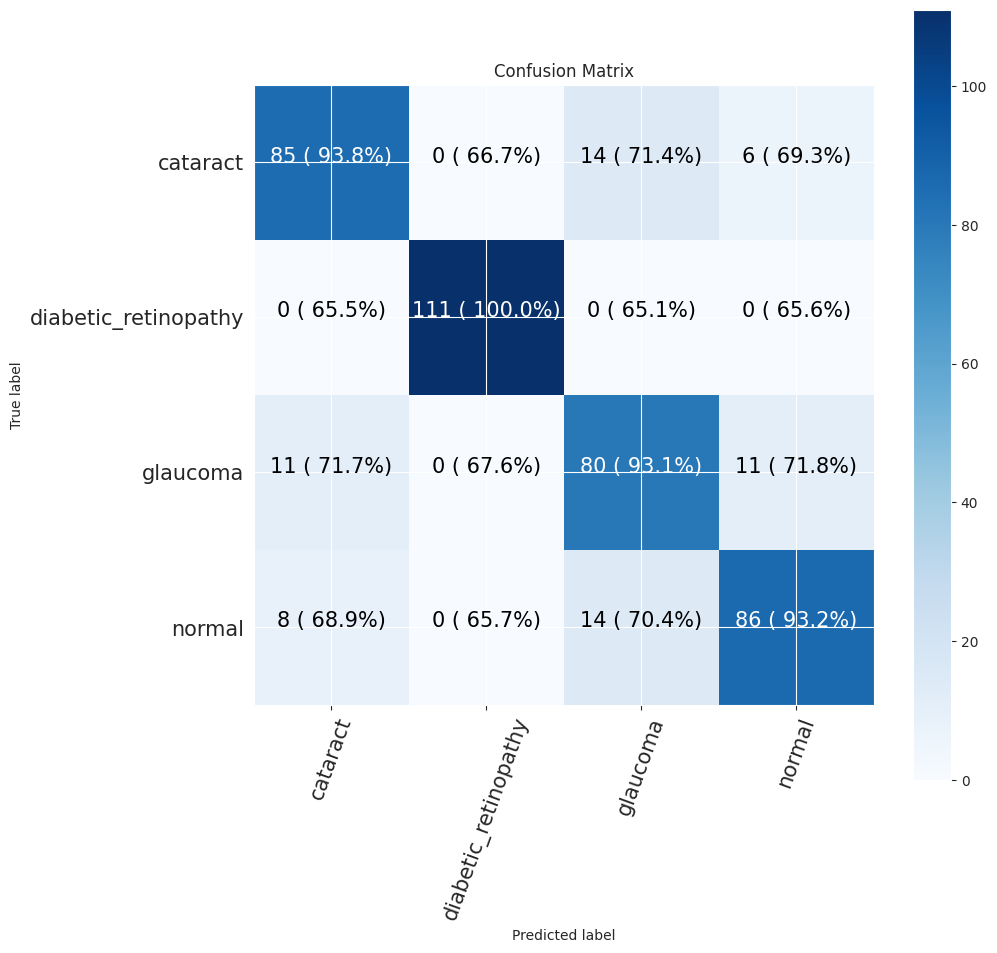

In [96]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


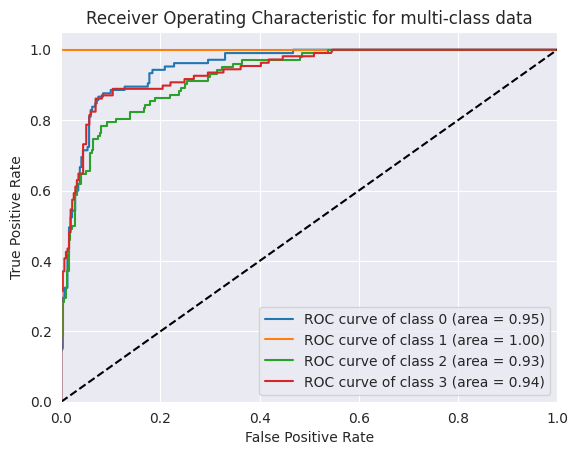

In [97]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [98]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [99]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, None, None, 3)]   0         
                                                                 
 conv2d_14 (Conv2D)          (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_7  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_23 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_24 (Dense)            (None, 4)                 4100      
                                                           

In [100]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

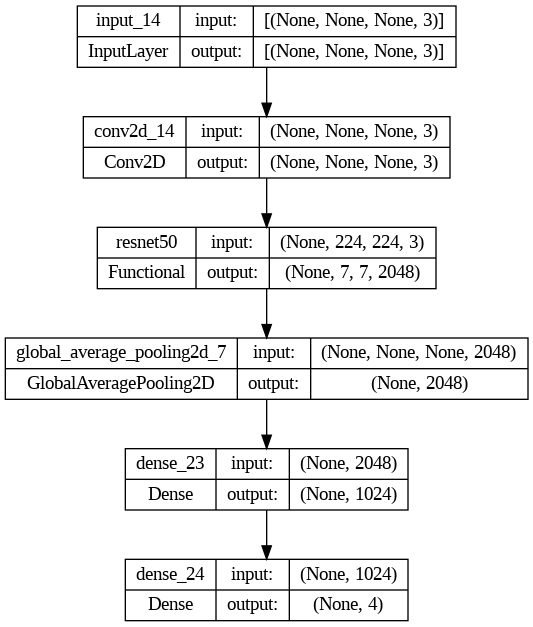

In [101]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [102]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [103]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 39s 589ms/step - loss: 0.3500 - accuracy: 0.7168 - val_loss: 0.2140 - val_accuracy: 0.8401 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 27s 498ms/step - loss: 0.1893 - accuracy: 0.8577 - val_loss: 0.1700 - val_accuracy: 0.8735 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 27s 497ms/step - loss: 0.1592 - accuracy: 0.8835 - val_loss: 0.1462 - val_accuracy: 0.8926 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 27s 498ms/step - loss: 0.1390 - accuracy: 0.8956 - val_loss: 0.1482 - val_accuracy: 0.9045 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 27s 497ms/step - loss: 0.1232 - accuracy: 0.9087 - val_loss: 0.1300 - val_accuracy: 0.9069 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 27s 498ms/step - loss: 0.1077 - accuracy: 0.9181 - val_loss: 0.1326 - val_accuracy: 0.8998 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 27s 499ms/st

ResNet50 Evaluation

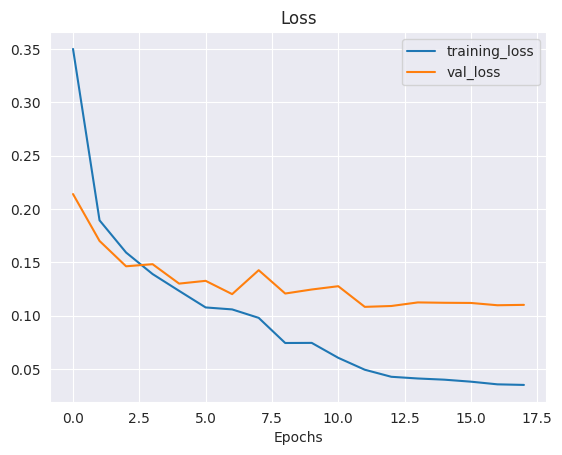

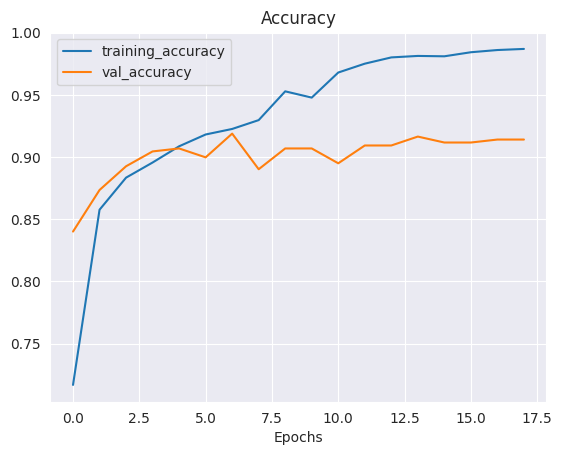

In [104]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 1s 179ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.95      0.93       105
           1       1.00      0.97      0.99       111
           2       0.89      0.88      0.89       102
           3       0.89      0.89      0.89       108

    accuracy                           0.92       426
   macro avg       0.92      0.92      0.92       426
weighted avg       0.93      0.92      0.93       426

Specificity: [0.3067484662576687, 0.33962264150943394, 0.26785714285714285, 0.2909090909090909]
Mean Squared Error: : 0.10366328060626984
The average AUC-ROC is 0.9876570371925639


[0.9842271293375394,
 0.6698113207547169,
 0.6861538461538461,
 0.6761006289308176,
 0.6498422712933754,
 0.9905660377358491,
 0.6615384615384615,
 0.6572327044025157,
 0.6908517350157729,
 0.6792452830188679,
 0.963076923076923,
 0.7044025157232704,
 0.6750788643533123,
 0.660377358490566,
 0.6892307692307692,
 0.9622641509433962]

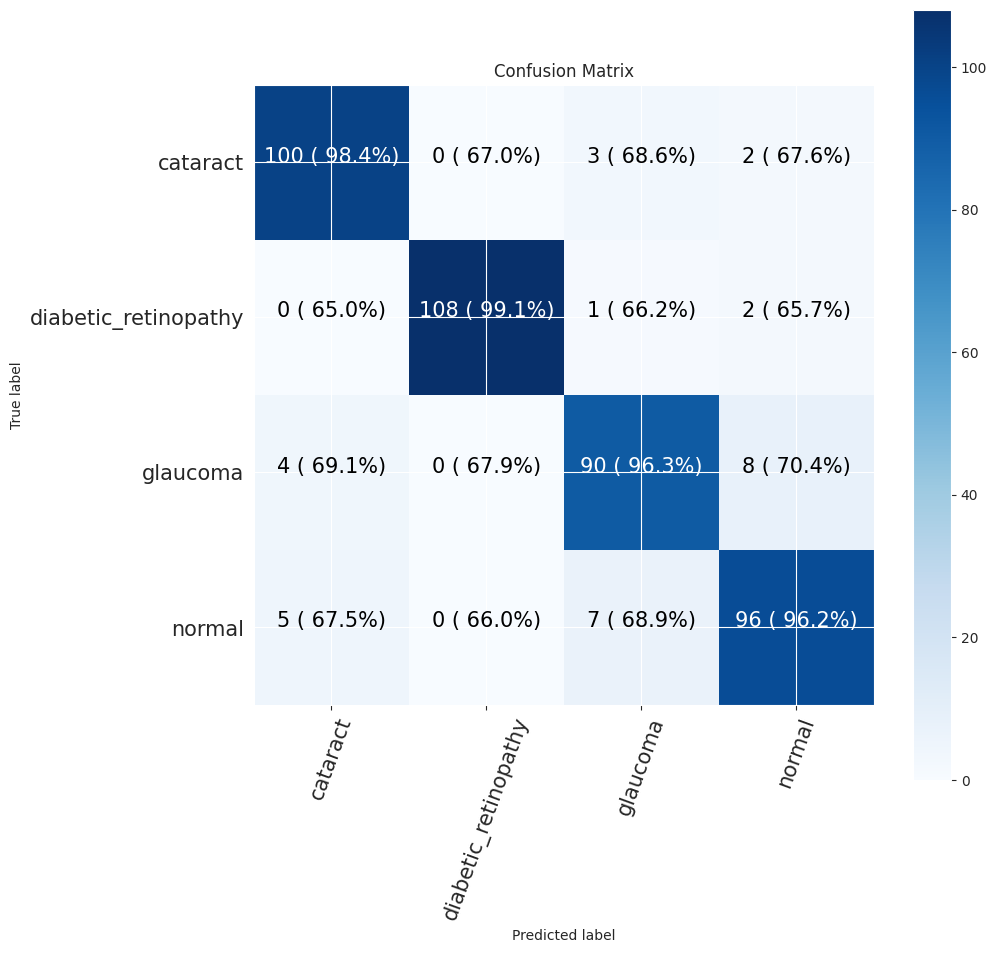

In [105]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


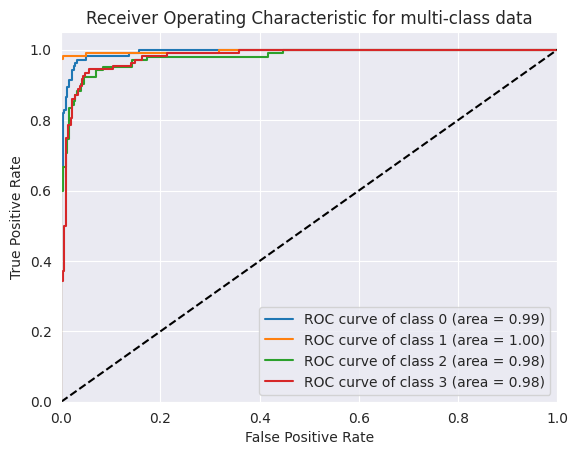

In [106]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [107]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [108]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



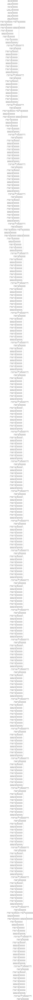

In [109]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [110]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_8  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_25 (Dense)            (None, 32)                65568     
                                                           

In [111]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [112]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 96s 2s/step - loss: 0.8034 - accuracy: 0.6747 - val_loss: 0.7038 - val_accuracy: 0.7327 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 66s 1s/step - loss: 0.5294 - accuracy: 0.7915 - val_loss: 0.6321 - val_accuracy: 0.7661 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 49s 928ms/step - loss: 0.4512 - accuracy: 0.8277 - val_loss: 0.4513 - val_accuracy: 0.8425 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 53s 1s/step - loss: 0.3956 - accuracy: 0.8464 - val_loss: 0.4236 - val_accuracy: 0.8496 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 52s 970ms/step - loss: 0.3583 - accuracy: 0.8663 - val_loss: 0.5046 - val_accuracy: 0.8329 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 48s 904ms/step - loss: 0.3525 - accuracy: 0.8627 - val_loss: 0.3903 - val_accuracy: 0.8568 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 40s 745ms/step - loss

ResNet50 Evaluation

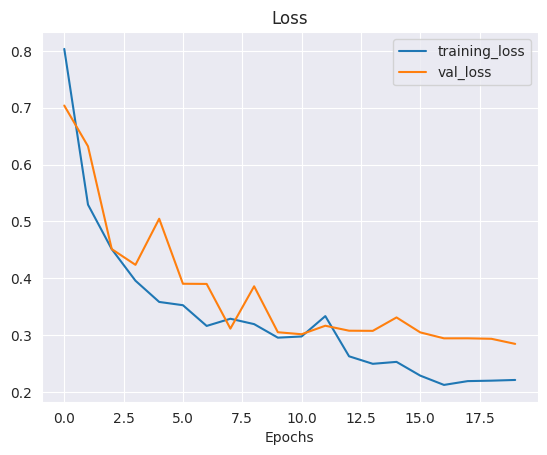

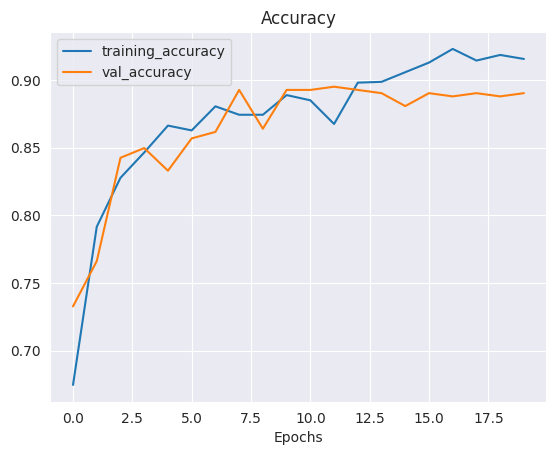

In [113]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


7/7 [==============================] - 2s 292ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.90      0.93       105
           1       0.96      0.94      0.95       111
           2       0.84      0.82      0.83       102
           3       0.81      0.90      0.85       108

    accuracy                           0.89       426
   macro avg       0.89      0.89      0.89       426
weighted avg       0.89      0.89      0.89       426

Specificity: [0.28313253012048195, 0.32298136645962733, 0.24561403508771928, 0.2948328267477204]
Mean Squared Error: : 0.11133362352848053
The average AUC-ROC is 0.9864579969480072


[0.9664634146341463,
 0.6698113207547169,
 0.7085889570552147,
 0.6601307189542484,
 0.6615853658536586,
 0.9779874213836478,
 0.6625766871165644,
 0.6568627450980392,
 0.6920731707317073,
 0.6823899371069182,
 0.9447852760736196,
 0.7189542483660131,
 0.6798780487804879,
 0.6698113207547169,
 0.6840490797546013,
 0.9640522875816994]

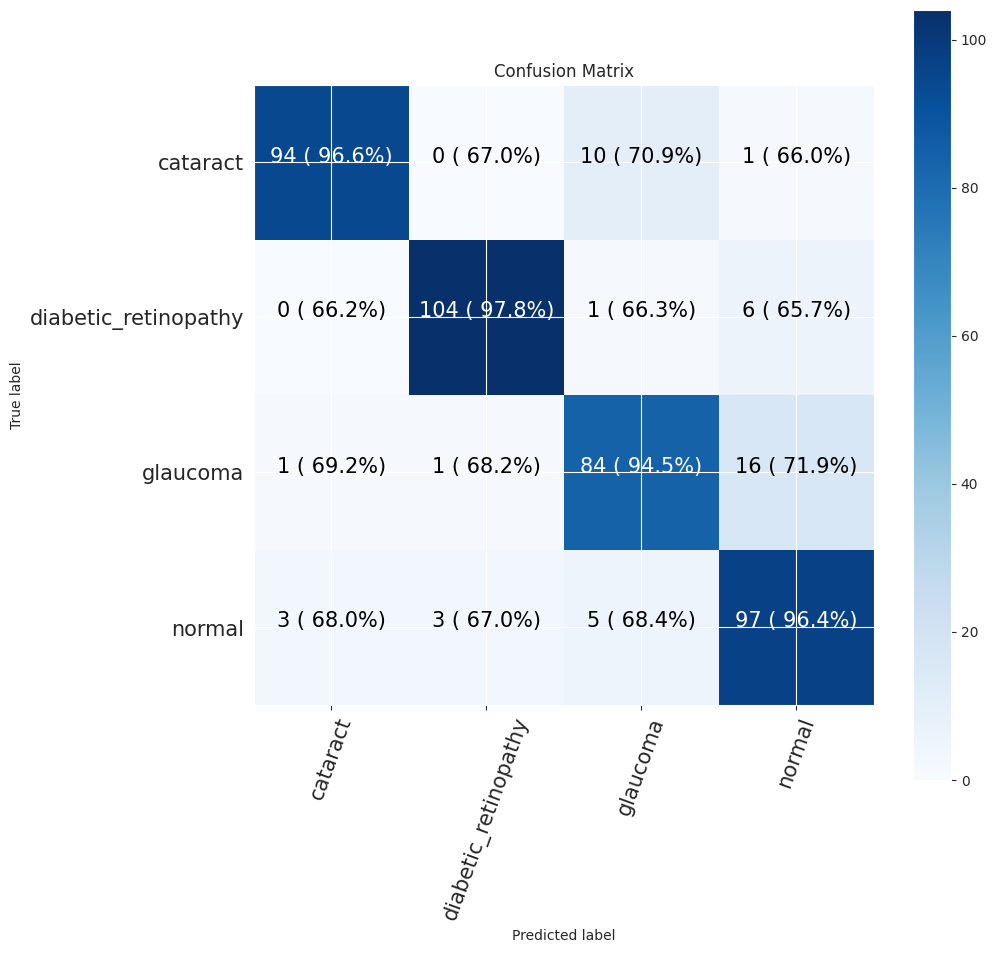

In [114]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


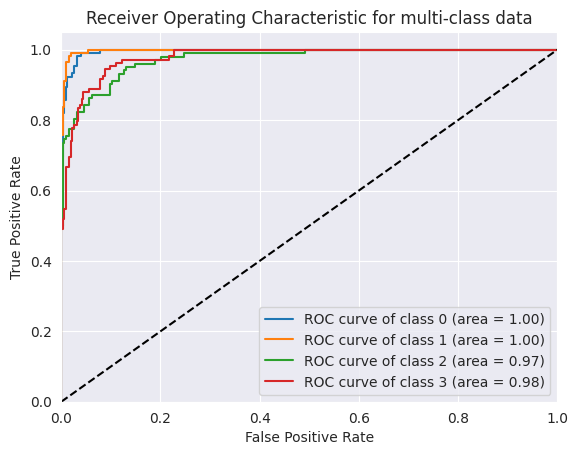

In [115]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()